# Deep Learning with ResNet-50

By Zhu Xiaochen (A0194512H)

Previously, we have demonstrated that:

1. Vanilla CNN models suffer from vanishing gradient issue, which leads to residual networks.
2. Simple ResNet models suffer from overfitting issue, while Dropout layers, data augmentation or reducing the model complexity do not help.
3. Double descent tells us that maybe a more complicated model might actually generalize better.
4. Initialization points really matter.

Hence, here we experiment the ResNet-50 model with pre-trained weights on ImageNet.

Compared with previous attempts, we added the following improvements to this notebook:

1. More complicated data augmentation
2. Early stopping when the monitored metric stops improving.
3. Reducing learning rate when the monitored metric stops improving.
4. Detailed evaluation on the model performance.
5. Grad-CAM for model explainability.

References:

1. https://github.com/iElasri/DeepWeeds_ComputerVision
1. https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet50/ResNet50
1. https://scikit-learn.org/0.15/auto_examples/plot_roc.html
1. https://keras.io/examples/vision/grad_cam/
1. https://stackoverflow.com/questions/66182884/how-to-implement-grad-cam-on-a-trained-network

## Import libraries and load data

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from keras import layers
import matplotlib.cm as cm
import math

In [2]:
data_train = tfds.load("deep_weeds", with_info=False, split='train[0%:60%]')
data_valid  = tfds.load("deep_weeds", with_info=False, split='train[60%:80%]')
data_test  = tfds.load("deep_weeds", with_info=False, split='train[80%:100%]')

## Data preprocessing and augmentation

In [3]:
def preprocess(dict):
  processed_image = tf.image.resize(dict['image'], [224,224]) / 255
  processed_label = dict['label']
  return processed_image, processed_label

# Augmentation used in the paper
def augment(image, label):
    # Random brightness
    image = tf.image.random_brightness(image, max_delta=0.5)
    # random hoeizontal flip
    image = tf.image.random_flip_left_right(image)
    # random vertical flip
    image = tf.image.random_flip_up_down(image)
    # random shiffting of the channels
    image = tf.image.random_hue(image, max_delta=0.1)
    # Adjust contrast
    image = tf.image.random_contrast(image, lower=0.7, upper=1.3)
    #random rotation
    delta = tf.random.uniform([], minval = math.radians(-360), maxval = math.radians(360), dtype=tf.float32)
    image = tf.image.rot90(image, tf.dtypes.cast(delta, tf.int32))
    return image, label

# Use the batch method to prepare batches.
train_ds = (data_train
                .map(preprocess)
                .cache()
                .map(augment, num_parallel_calls=tf.data.experimental.AUTOTUNE)
                .batch(32)
                .prefetch(tf.data.experimental.AUTOTUNE))

valid_ds = data_valid.map(preprocess).cache().batch(32)
test_ds = data_test.map(preprocess).cache().batch(32)

## Build the model with ResNet50

In [4]:
initial_lr = 0.0001
num_classes = 9

input = layers.Input((224,224,3))
resnet = keras.applications.ResNet50(include_top=False, weights="imagenet", input_tensor=input)
gap = layers.GlobalAveragePooling2D()(resnet.output)
flatten = layers.Flatten()(gap)
output = layers.Dense(num_classes, activation="softmax")(flatten)
model = tf.keras.Model(resnet.input, output)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=initial_lr),
    loss="sparse_categorical_crossentropy",
    metrics="accuracy")

## Model training

In [5]:
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(patience=16, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau('val_loss', factor=0.5, patience=16, min_lr=0.000003125)

my_callbacks = [early_stopping, reduce_lr]

log = model.fit(x=train_ds,
          epochs=100,
          batch_size=32,
          validation_data=valid_ds,
          callbacks = my_callbacks)

Epoch 1/100
329/329 [==============================] - 97s 272ms/step - loss: 0.7884 - accuracy: 0.7356 - val_loss: 5.6699 - val_accuracy: 0.0597
Epoch 2/100
329/329 [==============================] - 89s 271ms/step - loss: 0.4160 - accuracy: 0.8569 - val_loss: 2.3729 - val_accuracy: 0.1939
Epoch 3/100
329/329 [==============================] - 88s 267ms/step - loss: 0.3117 - accuracy: 0.8955 - val_loss: 1.5682 - val_accuracy: 0.5051
Epoch 4/100
329/329 [==============================] - 89s 271ms/step - loss: 0.2407 - accuracy: 0.9203 - val_loss: 0.3572 - val_accuracy: 0.8835
Epoch 5/100
329/329 [==============================] - 89s 271ms/step - loss: 0.2091 - accuracy: 0.9281 - val_loss: 0.3755 - val_accuracy: 0.8755
Epoch 6/100
329/329 [==============================] - 89s 270ms/step - loss: 0.1881 - accuracy: 0.9360 - val_loss: 0.3747 - val_accuracy: 0.8923
Epoch 7/100
329/329 [==============================] - 89s 271ms/step - loss: 0.1485 - accuracy: 0.9497 - val_loss: 0.2201 -

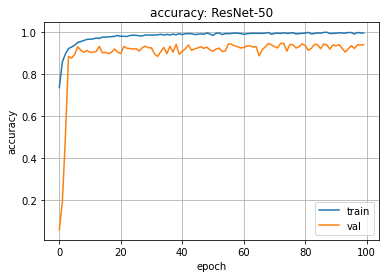

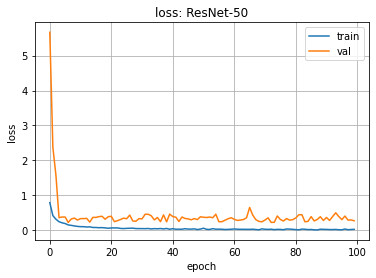

In [14]:
plt.plot(log.history['accuracy'])
plt.plot(log.history['val_accuracy'])
plt.title('accuracy: ResNet-50')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.grid()
plt.show()

plt.plot(log.history['loss'])
plt.plot(log.history['val_loss'])
plt.title('loss: ResNet-50')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.grid()
plt.legend(['train', 'val'], loc='upper right')
plt.show()

## Save history and model

In [22]:
import pandas as pd

log_df = pd.DataFrame(log.history)
log_file = './log/resnet50_log.csv'
with open(log_file, mode='w') as f:
    log_df.to_csv(f)

In [23]:
model.save("./models/resnet50.h5")

C:\Users\zhuxiaochen\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


## Model evaluation over test dataset

In [113]:
predictions = model.predict(test_ds)
labels = np.concatenate([x[1] for x in test_ds])
weeds_label = ["Chinee apple", "Lantana", "Parkinsonia", "Parthenium", "Prickly acacia", "Rubber vine", "Siam weed", "Snake weed", "Negatives"]

with open('./log/resnet50-predictions.npy', 'wb') as f:
    np.save(f, predictions)
with open('./log/resnet50-labels.npy', 'wb') as f:
    np.save(f, labels)

### Precision, recall, F1-score and accuracy

In [114]:
from sklearn.metrics import classification_report
print(classification_report(labels, np.argmax(predictions, axis=1), target_names=weeds_label))

                precision    recall  f1-score   support

  Chinee apple       0.90      0.79      0.84       234
       Lantana       0.83      0.95      0.89       211
   Parkinsonia       0.98      0.95      0.96       213
    Parthenium       0.92      0.93      0.92       203
Prickly acacia       0.88      0.96      0.92       217
   Rubber vine       0.95      0.89      0.92       200
     Siam weed       0.97      0.83      0.90       218
    Snake weed       0.91      0.81      0.86       235
     Negatives       0.94      0.97      0.95      1771

      accuracy                           0.93      3502
     macro avg       0.92      0.90      0.91      3502
  weighted avg       0.93      0.93      0.93      3502



Overall accuracy of 93%. Not bad!

### Multi-class ROC curves

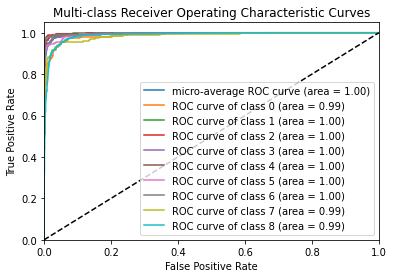

In [121]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

vectorized_lables = label_binarize(labels, classes=[0,1,2,3,4,5,6,7,8])
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(vectorized_lables[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(vectorized_lables.ravel(), predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'
                                   ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class Receiver Operating Characteristic Curves')
plt.legend(loc="lower right")
plt.show()

## Model explainability via Grad-CAM

In [61]:
last_conv_layer_name = "conv5_block3_out"

images = [[x for x in test_ds.take(1)][0][0][i] for i in range(32)]
img_arrays = [(tf.image.resize(images[i], [224,224])/255).numpy().reshape((1,224,224,3)) for i in range(32)]

model_grad_cam = tf.keras.models.clone_model(model)

In [65]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def gradcam_img(img_array, heatmap, alpha=0.001):

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array.shape[1], img_array.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img_array

    return superimposed_img

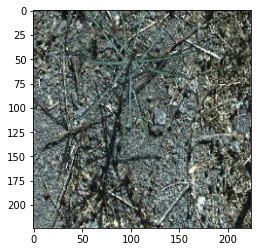

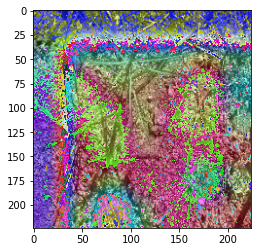

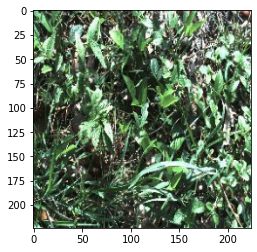

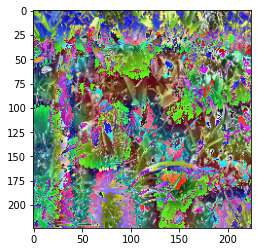

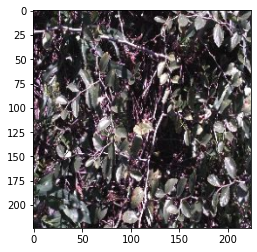

...

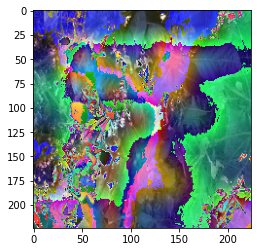

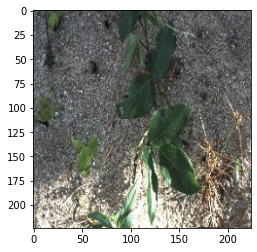

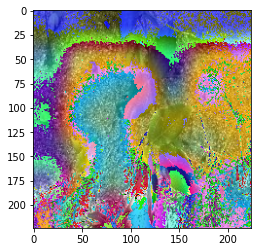

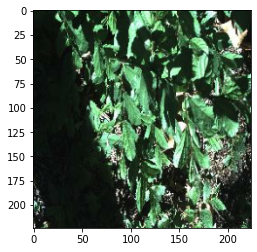

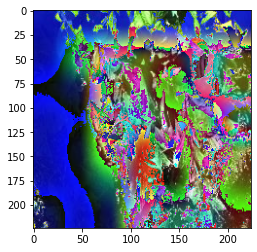

In [86]:
imgs = []

for (image, img_array) in zip(images, img_arrays):
    model_grad_cam.layers[-1].activation = None
    heatmap = make_gradcam_heatmap(img_array, model_grad_cam, "conv5_block3_out")

    output_img = gradcam_img(image, heatmap, alpha=0.005)

    imgs.append([image, (output_img.numpy() * 255).astype(np.uint8)])

for i in range(32):
    for j in range(2):
        plt.imshow(imgs[i][j])
        plt.show()